In [1]:


# Reconstruction of Calibration Source map with measured synth. beam
#### J.-Ch. Hamilton heavily inspired by Martin Gamboa's notebook scanSource_oneDet.ipynb

from matplotlib import rc
rc('figure', figsize=(15,8))
rc('font', size=12)
rc('text', usetex=False)
rc('image', cmap='viridis')

import healpy as hp
import pickle
from importlib import reload
import matplotlib.pyplot as plt
import qubic.io
from pysimulators import FitsArray
import qubic.fibtools as ft
import qubic.demodulation_lib as dl
import qubic.sb_fitting as sbfit
from qubicpack.utilities import Qubic_DataDir
import qubic.SpectroImLib as si
import qubic.selfcal_lib as sc
import numpy as np

# Import jchinstrument from ../
import os,sys,inspect
current_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parent_dir = os.path.dirname(current_dir)
sys.path.insert(0, parent_dir) 
import qubic.jchinstrument as jcinst



In [2]:
#are you using mike's gaussian beams
usegauss=False

In [3]:
os.environ['QUBIC_DATADIR']='Users/mwright/Documents/QubicScripts'
os.environ['QUBIC_PEAKS']='QubicPeaks/'

global_dir = Qubic_DataDir(datafile='instrument.py', datadir=os.environ['QUBIC_DATADIR'])

In [4]:
def plotcircle(c, r, color=None,lw=None, ls=None):
    nn = 100
    ang = np.linspace(0,2*np.pi, nn)
    plt.plot(c[0]+r*np.cos(ang), c[1]+r*np.sin(ang), color=color)

In [5]:
def aperture_photometry(img, centers, rads, plot=False, stampsize=25, magnitude_zero=0, cmap='gray_r', subs=True):
    npix = np.shape(img)[0]
    xx,yy = np.meshgrid(np.arange(npix), np.arange(npix))
    nobjects = np.shape(centers)[0]
    flux = np.zeros(nobjects)
    err_flux = np.zeros(nobjects)
    nsq = int(np.ceil(np.sqrt(nobjects)))
    for i in range(nobjects):
        c = centers[i,:]
        inner_pix = np.sqrt((xx-c[0])**2+(yy-c[1])**2) < rads[0]
        outer_pix = (np.sqrt((xx-c[0])**2+(yy-c[1])**2) > rads[0]) & (np.sqrt((xx-c[0])**2+(yy-c[1])**2) < rads[1])
        Nin = inner_pix.sum()
        Nout = outer_pix.sum()
        #bg = np.mean(img[outer_pix])
        bg = np.median(img[outer_pix])
        sigbg = np.std(img[outer_pix])/np.sqrt(Nout)
        flux[i] = np.sum(img[inner_pix])-bg*inner_pix.sum()
        err_flux[i] = np.std(img[outer_pix]) * np.sqrt(Nin * (1+Nin*1./Nout))
    
        if plot:
            if subs:
                subplot(nsq,nsq,i+1)
            plt.imshow(img, cmap=cmap, vmin=-5*np.std(img), vmax=5*np.std(img), origin='lower')
            plt.colorbar()
            plt.xlim(c[0]-stampsize, c[0]+stampsize)
            plt.ylim(c[1]-stampsize, c[1]+stampsize)
            plotcircle(c, rads[0], color='r', lw=2)
            plotcircle(c, rads[1], color='r', lw=2)
    mag = -2.5*np.log10(flux) + magnitude_zero
    err_mag = 2.5/np.log(10.) * err_flux/flux
    return flux, err_flux, mag, err_mag

In [6]:
def mygaussian(x, pars, extra_args=None):
    return pars[0]+pars[1]*np.exp(-0.5*(x-pars[2])**2/pars[3]**2)

In [7]:
def do_some_dets(detnums, d, directory, fittedpeaksfile, custom=False, 
                 nside=None, tol=5e-3, refit=False, resample=False, newsize=70, 
                 doplot=True, verbose=True, sbfitmodel=None, angs=None, usepeaks=None,
                 azmin=None, azmax=None, remove=None, fitted_directory=None, weighted=False,
                nf_sub_rec=1, lowcut=1e-3, highcut=0.3, filtering=True):
    if nside is not None:
        d['nside']=nside
    s = qubic.QubicScene(d)
    ids = detnums.copy()
    
    q = qubic.QubicMultibandInstrument(d)
    xgrf, ygrf, FP_index, index_q = sc.get_TES_Instru_coords(q[0], frame='GRF', verbose=False)

    if not custom:
        if verbose:
            print('')
            print('Normal Reconstruction')
        qcut = select_det(qubic.QubicMultibandInstrument(d),ids)
        #qcut = select_det(qubic.QubicMultibandInstrument(d),[145])
    else:
        if verbose:
            print('')
            print('Custom Reconstruction')
        ### Refit or not the locations of the peaks 
        ### from the synthesized beam images      
        ### First instantiate a jchinstrument (modified from instrument 
        ### to be able to read peaks from a file)
        qcut = select_det(jcinst.QubicMultibandInstrument(d),ids)
        
        ### In the present case, we use the peak measurements at 150 GHz
        ### So we assume its index is len(qcut)//2
        id150 = len(qcut)//2
        nu = qcut[id150].filter.nu
        synthbeam = qcut[id150].synthbeam
        horn = getattr(qcut[id150], 'horn', None)
        primary_beam = getattr(qcut[id150], 'primary_beam', None)
        thecos = np.cos(np.radians(50))

        if refit:
            if verbose: 
                print('We refit the peak locations')
            ### We call the fitting function for the Synthesized beam
            xypeaks = []
            for i in range(len(detnums)):
                if fitted_directory is None:
                    flatmap, az, el = sbfit.get_flatmap(detnums[i], directory, 
                                                        azmin=azmin, azmax=azmax, remove=remove)
                    if sbfitmodel is None:
                        sbfitmodel = sbfit.SbModelIndepPeaks(nrings=2, common_fwhm=True, 
                                                         no_xy_shift=False, distortion=False)
                    if verbose: 
                        print('Using Fit Model {} for TES #{}'.format(sbfitmodel.name,detnums[i]))
                    
                    plt.figure()
                    fit, thexypeaks = sbfit.fit_sb(flatmap, az, el, sbfitmodel, resample=resample, newsize=newsize,
                                                   verbose=verbose, doplot=True, 
                                                   extra_title='TES #{}'.format(detnums[i]))
                    print('FITING')
                    plt.show()
                else:
                    flatmap, az, el, fitmap, thexypeaks = sbfit.get_flatmap(detnums[i], directory, 
                                                                            azmin=azmin, azmax=azmax, remove=remove,
                                                                           fitted_directory=fitted_directory)
                xypeaks.append(thexypeaks)
                
            ### Convert to measurement coordinate system
            xypeaks = np.array(xypeaks)
            allthetas_M = np.radians(90-(xypeaks[:,1,:]-50))
            allphis_M = np.radians(-xypeaks[:,0,:])#*thecos)
            allvals_M = xypeaks[:,2,:]
        else:           
            if verbose: print('No refitting of the peak locations')
            ### We just read them from the old peak file
            peaks = np.array(FitsArray(fittedpeakfile))
            peaks[:,0,:] = peaks[:,0,:]/thecos
            ### An put them in the expected format
            mypeaks = peaks[np.array(detnums)-1,:,:]
            allthetas_M = np.radians(90-(mypeaks[:,1,:]-50))
            allphis_M = np.radians(-mypeaks[:,0,:]*thecos)
            allvals_M = mypeaks[:,2,:]
        
        ### Now we want to perform the rotation to go to boresight 
        ### reference frame (used internally by QubicSoft)
        if angs is None:
            angs = np.radians(np.array([0, 90, 0]))
        allthetas_Q = np.zeros_like(allthetas_M)
        allphis_Q = np.zeros_like(allthetas_M)
        allvals_Q = np.zeros_like(allthetas_M)
        numpeak = np.zeros(len(detnums), dtype=int)
        for idet in range(len(detnums)):
            allthetas_Q[idet,:], allphis_Q[idet,:] = sbfit.rotate_q2m(allthetas_M[idet,:], 
                                                                      allphis_M[idet,:], 
                                                                      angs=angs, inverse=True)
            allvals_Q[idet,:] = allvals_M[idet,:]/np.max(allvals_M[idet,:])*synthbeam.peak150.solid_angle * (150e9 / nu)**2 / s.solid_angle * len(horn)
            print('For TES {}'.format(idet))
            print('Thetas: {}'.format(np.degrees(allthetas_Q[idet,:])))
            print('Phis: {}'.format(np.degrees(allphis_Q[idet,:])))
            
            #### Louise mentions a pi rotation of the measured SB w.r.t. simulations => we apply it here
            allphis_Q[idet,:] += np.pi
        
        ### get TES position in the GRF
        for idet in range(len(detnums)):
            plt.clf()
            ax=plt.subplot(131)
            ax.set_aspect('equal')
            plt.plot(xgrf, ygrf, 'k+')
            plt.xlim(-0.053, 0)
            plt.ylim(0, 0.053)

            position = np.ravel(qcut[0].detector[idet].center)
            print(position)
            plt.plot(position[0], position[1], 'ro', label='TES#{}'.format(detnums[idet]))
            plt.legend()
            
            
            print('==== Position ==')
            position = -position / np.sqrt(np.sum(position**2))
            print(position)
            theta_center = np.arcsin(np.sqrt(position[0]**2 + position[1]**2))
            phi_center = np.arctan2(position[1], position[0])
            print(theta_center, phi_center)
            print('=================')
        
            ax=plt.subplot(132, projection='polar')
            plt.title('Initial')
            rav_phQ = np.ravel(allphis_Q[idet,:])
            rav_thQ = np.ravel(allthetas_Q[idet,:])
            #plt.scatter(rav_phQ, rav_thQ, s=np.ravel(allvals_Q[idet,:])/np.max(allvals_Q[idet,:])*300)
            #for k in range(len(rav_phQ)):
            #    plt.text(rav_phQ[k], rav_thQ[k], k)
            #ax.set_rmax(0.5)
            plt.plot(phi_center, theta_center,'r+', ms=10, markeredgewidth=3, label = 'Th. Line of sight')
        
            ## Now we identify the nearest peak to the theoretical Line Of Sight
            angdist = np.zeros(len(rav_phQ))
            for k in range(len(rav_phQ)):
                angdist[k] = sbfit.ang_dist([theta_center, phi_center], [rav_thQ[k], rav_phQ[k]])
                print(k,np.degrees(angdist[k]))
            idxmin = np.argmin(angdist)

            
            
            numpeak[idet]=idxmin
            throt = allthetas_Q[idet,numpeak[idet]]
            phrot = allphis_Q[idet,numpeak[idet]]
            ## Rotate around the position predicted from the TES location
            #throt = theta_center
            #phrot = phi_center
            print('+++++++++++')
            print(throt, phrot)
            print('+++++++++++')

            plt.plot(phrot, throt, 'gx', ms=15, markeredgewidth=2, label='Measured Line of sight')
            ax.set_rmax(0.5)
            plt.legend()

            myangs = np.array([phrot,throt, phrot])
            newth, newph = sbfit.rotate_q2m(allthetas_Q[idet,:], allphis_Q[idet,:], angs=myangs, inverse=True)
        
            #ax=plt.subplot(133, projection='polar')
            #plt.plot(np.ravel(allphis_Q[idet,:]), np.ravel(allthetas_Q[idet,:]), s=np.ravel(allvals_Q[idet,:])/np.max(allvals_Q[idet,:])*300)
            #plt.title('Back')
            #for k in range(len(qcut)):
            #    factor = 150e9/qcut[k].filter.nu
            #    newthfinal, newphfinal = sbfit.rotate_q2m(newth*factor, newph, angs=myangs, inverse=False)
            #    plt.plot(np.ravel(newphfinal), np.ravel(newthfinal), s=np.ravel(allvals_Q)/np.max(allvals_Q)*300)
            #ax.set_rmax(0.5)
            #plt.legend()
            #plt.show()


        ### We nowwrite the temporary file that contains the peaks locations to be used
        if usepeaks is None:
            peaknums = np.arange(9)
        else:
            peaknums = usepeaks
        data = [allthetas_Q[:,peaknums], allphis_Q[:,peaknums]-np.pi, allvals_Q[:,peaknums], numpeak]
        file = open(os.environ['QUBIC_PEAKS']+'peaks.pk', 'wb')
        pickle.dump(data, file)
        file.close()
    

    ### Make the TODs from the measured synthesized beams
    # Read azimuth and elevation
    bla, az, el = sbfit.get_flatmap(detnums[0], directory, azmin=azmin, azmax=azmax)
    #az = FitsArray(directory + 'Flat/azimuth.fits')
    #el = FitsArray(directory + 'Flat/elevation.fits')
    # Build pointing from them
    p = hall_pointing(az, el, 0, 0, fix_azimuth=d['fix_azimuth'])
    # Read data and fill TOD
    realTOD = np.zeros((len(detnums),len(p)))
    sigmaTOD = np.zeros(len(detnums))
    if weighted:
        sumweight = 0.
    
    allimg = []
    for i in range(len(detnums)):
        img, a,b = sbfit.get_flatmap(detnums[i], directory, azmin=azmin, azmax=azmax, remove=remove)
        allimg.append(img)
        mm,ss = ft.meancut(img,3)
        c50 = np.cos(np.radians(50))
        plt.figure()
        plt.subplot(1,2,1)
        plt.imshow(img, vmin=mm-3*ss, vmax=mm+3*ss,
               extent=[np.min(a)*c50, np.max(a)*c50, np.min(b), np.max(b)], aspect='equal')
        plt.colorbar()
        plt.title('TOD {}'.format(detnums[i]))
        plt.subplot(1,2,2)
        plt.imshow(img, vmin=mm-3*ss, vmax=mm+3*ss,
               extent=[np.min(a)*c50, np.max(a)*c50, np.min(b), np.max(b)], aspect='equal')
        plt.plot(-np.degrees(allphis_M[i ,:]), 50+90-np.degrees(allthetas_M[i,:]), 'r+', ms=10, markeredgewidth=2)
        for k in range(len(np.degrees(allphis_M[idet,:]))):
            plt.text(-np.degrees(allphis_M[i,k])+0.3, 50+90-np.degrees(allthetas_M[i,k])+0.3,k, fontsize=15, weight='bold', color='r')
        plt.colorbar()
        plt.title('TOD {}'.format(detnums[i]))
        plt.show()
        print('####################################################++++++++++++++++++++++')
        print('i={}'.format(i))
        print('####################################################++++++++++++++++++++++')
        fact = 5e-28
        realTOD[i,:] = np.ravel(img) * fact
        if weighted:   ## Not to be used - old test...
            realTOD[i,:] *= 1./ss**2
            sumweight += 1./ss**2
        
#     ### Cut in azimuth and elevation
#     azmin = -15./np.cos(np.radians(50))
#     azmax = 15./np.cos(np.radians(50))
#     elmin = 20.
#     elmax = 80.
#     ok = ((p.azimuth >= azmin) & (p.azimuth <= azmax)) & ((p.elevation >= elmin) & (p.elevation <= elmax))
#     if verbose: print('AzEl cuts: Keeping only {} samples out of {}'.format(ok.sum(), len(ok)))
        
    ### Former code for single band
#     ### And we instantiate the QUBIC isntrument that uses qcut which a 
#     ### jchinstrument (modified to read the above file)
#     sima = qubic.QubicAcquisition(qcut, p, s, d)
#     ### Run the mapmaker
#     d['tol'] = tol
#     maps_recon, niter, error = sima.tod2map(realTOD, d, cov=None)
#     if verbose: print('Mapmaking QUBIC done in {} iterations with error: {}'.format(niter, error))

    ### new code multiband
    plt.figure()
    for i in range(len(detnums)):
        plt.plot(realTOD[i,:], label='TES#{0:}'.format(detnums[i]))
    plt.legend()
    plt.xlabel('Samples')
    plt.ylabel('TOD')
    plt.show()
    
    plt.figure()
    for i in range(len(detnums)):
        spectrum_f, freq_f = ft.power_spectrum(np.arange(len(realTOD[i,:])), realTOD[i,:])
        pl=plt.plot(freq_f, spectrum_f, label='TES#{0:}'.format(detnums[i]), alpha=0.5)
        plt.xscale('log')
        plt.yscale('log')
    plt.legend()
    plt.xlabel('Fourier mode')
    plt.ylabel('Power Spectrum')
    plt.title('Before Filtering')
    plt.show()
    
    for i in range(len(detnums)):
        plt.figure()
        if filtering: 
            realTOD[i,:] = ft.filter_data(np.arange(len(realTOD[i,:])), realTOD[i,:], lowcut, highcut)
        mm,ss = ft.meancut(realTOD[i,:],3)
        sigmaTOD[i] = ss 
        plt.subplot(1,2,1)
        plt.imshow(allimg[i] * fact, vmin=mm-3*ss, vmax=mm+3*ss,
               extent=[np.min(a)*c50, np.max(a)*c50, np.min(b), np.max(b)], aspect='equal')
        plt.colorbar()
        plt.title('Init - TOD {0:} RMS={1:5.2g}'.format(detnums[i],sigmaTOD[i]))
        plt.subplot(1,2,2)
        plt.imshow(np.reshape(realTOD[i,:], np.shape(img)), vmin=mm-3*ss, vmax=mm+3*ss,
               extent=[np.min(a)*c50, np.max(a)*c50, np.min(b), np.max(b)], aspect='equal')
        plt.colorbar()
        plt.title('Filtered - TOD {0:} RMS={1:5.2g}'.format(detnums[i],sigmaTOD[i]))

    
    plt.figure()
    for i in range(len(detnums)):
        spectrum_f, freq_f = ft.power_spectrum(np.arange(len(realTOD[i,:])), realTOD[i,:])
        pl=plt.plot(freq_f, spectrum_f, label='TES#{0:} Var*2pi={1:5.2g}'.format(detnums[i],sigmaTOD[i]**2*2*np.pi), alpha=0.5)
        plt.plot(freq_f, freq_f*0+sigmaTOD[i]**2*2*np.pi, color=pl[0].get_color())
        plt.xscale('log')
        plt.yscale('log')
    plt.ylim(np.min(sigmaTOD**2*2*np.pi)/10000, np.max(sigmaTOD**2*2*np.pi)*10000)
    plt.legend()
    plt.xlabel('Fourier mode')
    plt.ylabel('Power Spectrum')
    plt.title('After Filtering')
    if lowcut:
        plt.axvline(x=lowcut, color='k')
    if highcut:
        plt.axvline(x=highcut, color='k')    
    plt.show()

    
    
    plt.figure()
    plt.clf()
    print('%%%%%%%%%%%%%%%%%%%%%%')
    ax=plt.subplot(111, projection='polar')
    maps_recon, cov, nus, nus_edge = si.reconstruct_maps(realTOD, d, p,
                                                        nf_sub_rec, x0=None, instrument=qcut, verbose=True,
                                                        forced_tes_sigma=sigmaTOD)
    ax.set_rmax(0.5)
    #legend(fontsize=8)
    if weighted:
        maps_recon /= sumweight/len(detnums)
    return maps_recon, qcut, np.mean(cov, axis=0), nus, nus_edge



In [8]:
def hall_pointing(az, el, angspeed_psi, maxpsi,
                 date_obs=None, latitude=None, longitude=None,fix_azimuth=None,random_hwp=True):
    #This method will reproduce the pointing that is used in the hall to take the data. Will start from bottom
    #left and will go up at fixed elevation.
    
    #nsamples = 2*len(az)*len(el) # commented bucause not go and back
    nsamples = len(az)*len(el)
    #print('nsamples = ', nsamples)
    pp = qubic.QubicSampling(nsamples,date_obs=date_obs, period=0.1, latitude=latitude,longitude=longitude)
    
    #Comented because we do not go and back in simulations.. 
    #mult_el = []
    #for eachEl in el:
    #    mult_el.append(np.tile(eachEl, 2*len(az)))
    # Azimuth go and back and same elevation. 
    #az_back = az[::-1]
    #az = list(az)
    #az.extend(az_back)
    #mult_az = np.tile(az, len(el))
    #print(i,np.asarray(mult_el).ravel().shape)
    #pp.elevation = np.asarray(mult_el).ravel()
    #pp.azimuth = np.asarray(mult_az).ravel()
    
    mult_el = []
    for eachEl in el:
        mult_el.extend(np.tile(eachEl, len(az)))
    mult_az = []
    mult_az.append(np.tile(az, len(el)))
    #print(len(mult_el))
    pp.elevation = np.asarray(mult_el)#az2d.ravel()
    pp.azimuth = np.asarray(mult_az[0])#el2d.ravel()
    
    ### scan psi as well,
    pitch = pp.time * angspeed_psi
    pitch = pitch % (4 * maxpsi)
    mask = pitch > (2 * maxpsi)
    pitch[mask] = -pitch[mask] + 4 * maxpsi
    pitch -= maxpsi
    
    pp.pitch = pitch
    
    if random_hwp:
        pp.angle_hwp = np.random.random_integers(0, 7, nsamples) * 11.25
        
    if fix_azimuth['apply']:
        pp.fix_az=True
        if fix_azimuth['fix_hwp']:
            pp.angle_hwp=pp.pitch*0+ 11.25
        if fix_azimuth['fix_pitch']:
            pp.pitch= 0
    else:
        pp.fix_az=False

    return pp
    #print(pp.elevation)#, len(pp.elevation))





def select_det(q,idqp):
    """
    Returns a sub-instrument with detectors index given by idqp. These indices are to be understood
    in the qubicpack() numbering starting from 1
    """
    if len(q)==1:
        x, y, FP_index, index_q = sc.get_TES_Instru_coords(q, frame='ONAFP', verbose=False)
        q.detector = q.detector[index_q[np.array(idqp)-1]]
    else:
        x, y, FP_index, index_q = sc.get_TES_Instru_coords(q[0], frame='ONAFP', verbose=False)
        for i in range(len(q)):
            q[i].detector = q[i].detector[index_q[np.array(idqp)-1]]
    return(q)



In [9]:
# INSTRUMENT
ns = 256
d = qubic.qubicdict.qubicDict()
d.read_from_file(global_dir+'/dicts/global_source_oneDet_multiband.dict')
#d.read_from_file(global_dir+'/dicts/pipeline_demo.dict')
print(d['kind'])
d['kind']='I'
print(d['kind'])
d['nside']=ns

print(d['use_file'])

fittedpeakfile = 'RealisticReconstruction/peaks.pk'
# directory = '/Users/hamilton/Google Drive/QUBIC/Calib-TD/Files/Synthesized Beams/Synthesized_Beams_Files/150GHz-2019-04-06/'
# directory = '/Users/hamilton/Google Drive/QUBIC/Calib-TD/Files/Synthesized Beams/Synthesized_Beams_Files/130GHz-2019-04-18/'
# directory = '/Users/hamilton/Google Drive/QUBIC/Calib-TD/Files/Synthesized Beams/Synthesized_Beams_Files/170GHz-2019-04-14/'
# directory = '/Users/hamilton/Google Drive/QUBIC/Calib-TD/Files/Synthesized Beams/Synthesized_Beams_Files/140GHz-2019-04-10/'
directory = 'SynthesizedBeams/Synthesized_Beams_Files/150GHz-2019-04-06'



IQU
I
None


Text(0.5, 1.0, 'Median over all S.B. images (renormalized)')

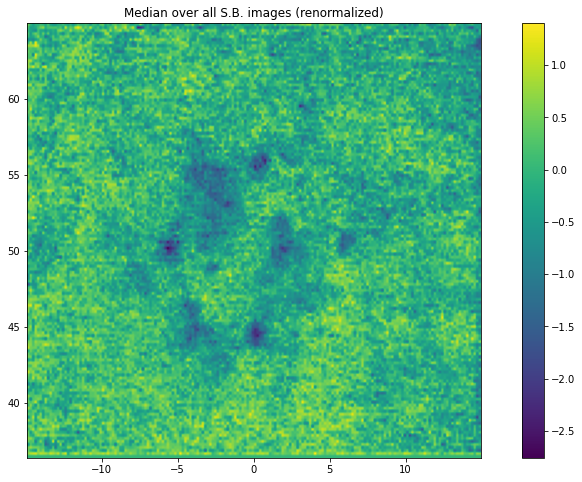

In [10]:
c50 = np.cos(np.radians(50))
azmin = -15./c50
azmax = 15./c50
flatmap, az, el = sbfit.get_flatmap(1, directory, azmin=azmin, azmax=azmax)
npix = len(np.ravel(flatmap))
alldata_renorm = np.zeros((256, npix))
for i in range(256):
    flatmap, az, el = sbfit.get_flatmap(i+1, directory, azmin=azmin, azmax=azmax)
    mm,ss = ft.meancut(flatmap,3)
    alldata_renorm[i,:] = np.ravel((flatmap-mm)/ss)  

med = np.reshape(np.median(alldata_renorm,axis=0),np.shape(flatmap))
mm=np.mean(med)
ss = np.std(med)

rc('figure', figsize=(15,8))
plt.imshow(np.reshape(med, np.shape(flatmap)),
       extent=[np.min(az)*c50, np.max(az)*c50, np.min(el), np.max(el)], aspect='equal')
plt.colorbar()
plt.title('Median over all S.B. images (renormalized)')

(256, 4, 9)


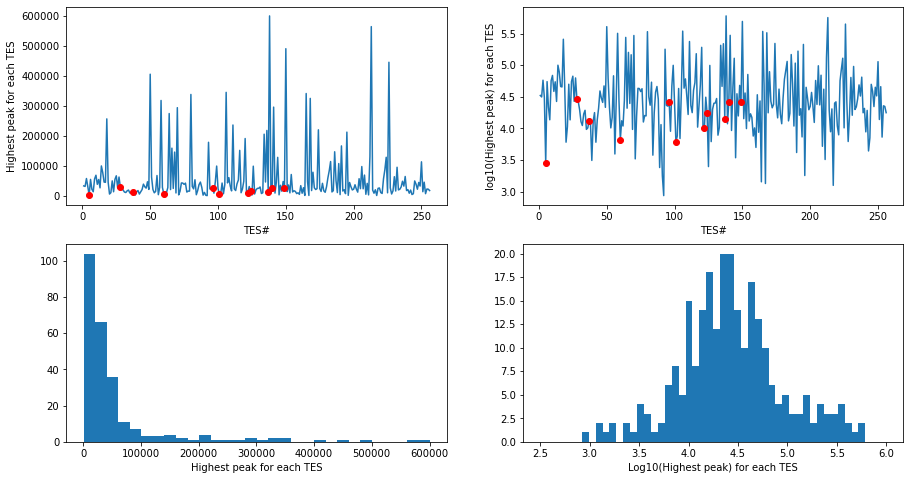

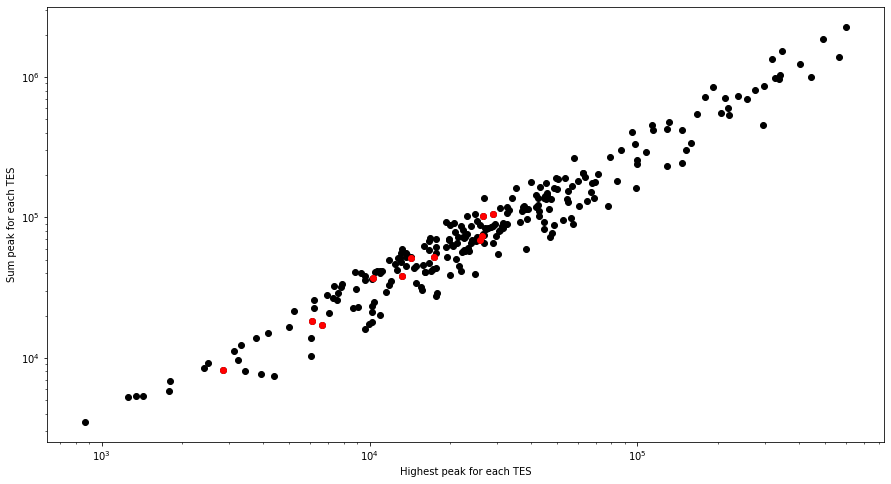

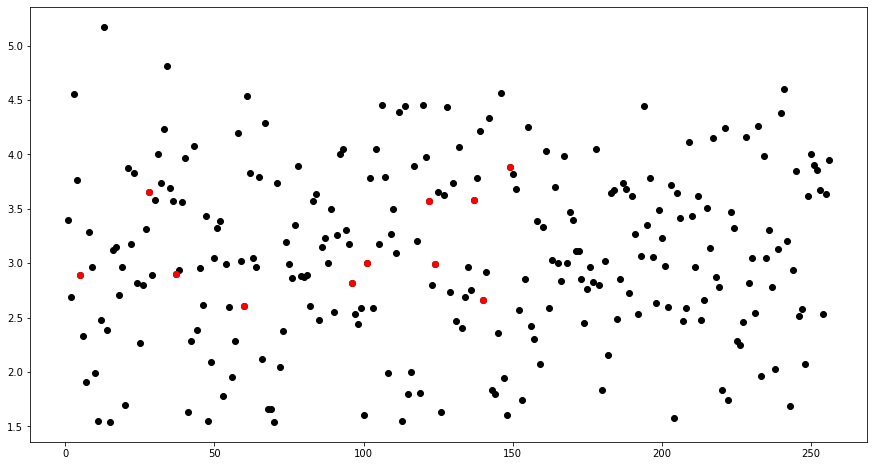

In [11]:
fittedpeakfile = 'SynthesizedBeams/fitted_peaks.fits'
peaks = np.array(FitsArray(fittedpeakfile))
print(np.shape(peaks))
maxpeakamps = np.max(peaks[:,2,:], axis=1)
sumpeakamps = np.sum(peaks[:,2,:], axis=1)

allnums = np.arange(256)+1
detsgood = [5, 28, 37, 60, 96, 101, 122, 124, 137, 140, 149]

plt.subplot(2,2,1)
plt.plot(allnums, maxpeakamps)
plt.plot(allnums[np.array(detsgood)-1], maxpeakamps[np.array(detsgood)-1], 'ro')
plt.xlabel('TES#')
plt.ylabel('Highest peak for each TES')

plt.subplot(2,2,2)
plt.plot(allnums, np.log10(maxpeakamps))
plt.plot(allnums[np.array(detsgood)-1], np.log10(maxpeakamps[np.array(detsgood)-1]), 'ro')
plt.xlabel('TES#')
plt.ylabel('log10(Highest peak) for each TES')

plt.subplot(2,2,3)
h = plt.hist(maxpeakamps, bins=30)
plt.xlabel('Highest peak for each TES')

plt.subplot(2,2,4)
h = plt.hist(np.log10(maxpeakamps), range=[2.5, 6], bins=50)
plt.xlabel('Log10(Highest peak) for each TES')


plt.figure()
plt.plot(maxpeakamps, sumpeakamps, 'ko')
plt.plot(maxpeakamps[np.array(detsgood)-1], sumpeakamps[np.array(detsgood)-1], 'ro')
plt.xlabel('Highest peak for each TES')
plt.ylabel('Sum peak for each TES')
plt.xscale('log')
plt.yscale('log')

plt.figure()
plt.plot(allnums, sumpeakamps/maxpeakamps, 'ko')
plt.plot(allnums[np.array(detsgood)-1], sumpeakamps[np.array(detsgood)-1]/maxpeakamps[np.array(detsgood)-1], 'ro')


In [12]:
reload(dl)
reload(sbfit)
reload(jcinst)
reload(si)
reload(ft)

<module 'qubic.fibtools' from '/Users/mwright/.local/lib/python3.9/site-packages/qubic/fibtools.py'>

In [13]:
# INSTRUMENT
ns = 256
d = qubic.qubicdict.qubicDict()
d.read_from_file(global_dir+'/dicts/global_source_oneDet_multiband.dict')
#d.read_from_file(global_dir+'/dicts/pipeline_demo.dict')
print(d['kind'])
d['kind']='I'
print(d['kind'])
d['nside']=ns
d['synthbeam_fraction']=0.99

fittedpeakfile = 'SynthesizedBeams/fitted_peaks.fits'
fitted_directory = 'FitSB/'

IQU
I


In [14]:
#### 150 GHz
detnums = [5, 37, 60, 96, 101, 122, 124, 137, 140, 149]

you are here
This is JCHInstrument Multiband Instrument
This is JCHInstrument Multiband Instrument
For TES 0
Thetas: [10.8533611   6.48182701 10.37505986  8.4159715   1.25217534  7.87398217
 11.82827964  9.47093339 11.92699159]
Phis: [   6.62195215  -42.69588386  -85.55705003   57.12012773  113.79934769
 -143.60180112   92.65641925  135.54281282  171.36126512]
For TES 1
Thetas: [11.81958916  8.13326719 11.69776107  7.88112854  0.545807    8.4009044
 11.02924522  7.56072468 10.82964568]
Phis: [  -0.98576942  -47.52363999  -87.91127228   43.51952813  -48.90168715
 -132.44306845   93.78439915  135.90856313 -177.09276019]
For TES 2
Thetas: [ 9.52591496  7.4079363  12.87229407  6.16246051  1.92417871 10.25361482
 10.83438431  8.76525982 12.58028774]
Phis: [  -4.58137484  -63.18511578  -97.50761231   53.13252842 -150.72245001
 -140.19351921  104.28923216  147.46055298 -174.6672707 ]
For TES 3
Thetas: [11.13325818  6.62096391 10.07878319  8.91129735  1.51778679  7.26471093
 12.55876983  9.419

/Users/mwright/.local/lib/python3.9/site-packages/qubic/sb_fitting.py:139: RuntimeWarning: invalid value encountered in arccos
  th = np.nan_to_num(np.arccos(uv[2] / r))


0 17.65096142683882
1 16.13397784338432
2 19.032183064610393
3 10.216659557416115
4 8.592330237848916
5 12.957273945376473
6 5.65463202580469
7 1.7557722925079364
8 9.636973005412443
+++++++++++
0.1319595395019137 5.513644561934441
+++++++++++
[-0.0204  0.0504 -0.3   ]
==== Position ==
[ 0.06690995 -0.16530694  0.98396986]
0.17929392956459572 -1.186191611972683
0 16.827869663467204
1 17.665637488024753
2 22.38012387444753
3 8.821317498637224
4 10.685343963880994
5 16.550939439546397
6 1.524566561608421
7 5.944249610607009
8 13.709319135430755
+++++++++++
0.1890956786833873 4.961783129192469
+++++++++++
[-0.0024  0.0024 -0.3   ]
==== Position ==
[ 0.00799949 -0.00799949  0.99993601]
0.011313225817824839 -0.7853981633974482
0 11.53136537226093
1 7.264299078386981
2 10.491516889878822
3 8.819109836472032
4 1.1170623545204312
5 7.191073389877839
6 12.157078402205604
7 8.772871764251548
8 10.935191381267538
+++++++++++
0.02649037681990696 4.7752254140196175
+++++++++++


/Users/mwright/.local/lib/python3.9/site-packages/qubic/sb_fitting.py:139: RuntimeWarning: invalid value encountered in arccos
  th = np.nan_to_num(np.arccos(uv[2] / r))


[-0.0084  0.0504 -0.3   ]
==== Position ==
[ 0.02760252 -0.16561509  0.98580411]
0.16869857798443652 -1.4056476493802699
0 17.734230498462864
1 16.509479240930013
2 19.01731517240315
3 9.627435964497266
4 8.742442391067758
5 12.799644920597096
6 6.072097686614502
7 1.5872086585570762
8 9.25325528715736
+++++++++++
0.14915990711114283 5.001933671825503
+++++++++++
[-0.0024  0.0354 -0.3   ]
==== Position ==
[ 0.00794463 -0.11718327  0.99307853]
0.11772400039505153 -1.503103304100928
0 17.73822113530457
1 14.67421725808024
2 18.170691631055078
3 8.009202283357133
4 11.10632946695203
5 17.91234361654156
6 0.4014428245276893
7 7.498541226434222
8 13.636919645893888
+++++++++++
0.12454879295401002 4.766957610551804
+++++++++++
[-0.0024  0.0294 -0.3   ]
==== Position ==
[ 0.00796161 -0.09752968  0.99520077]
0.09801094205255399 -1.4893442824890257
0 8.034582086632962
1 10.013312119672442
2 16.661284030117464
3 1.7994599520110273
4 6.05758052628397
5 14.16954977086918
6 7.089916373109425
7 10.3

/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/4008139068.py:35: RuntimeWarning: invalid value encountered in remainder
  pitch = pitch % (4 * maxpsi)
/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/4008139068.py:43: DeprecationWarning: This function is deprecated. Please call randint(0, 7 + 1) instead
  pp.angle_hwp = np.random.random_integers(0, 7, nsamples) * 11.25


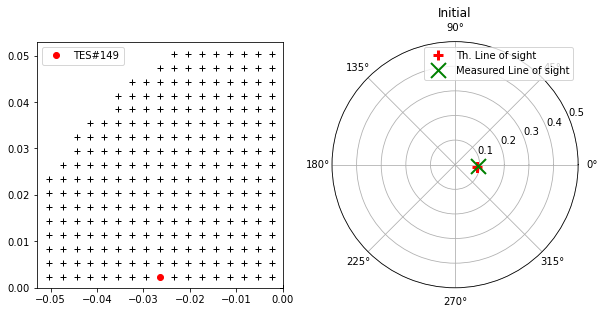

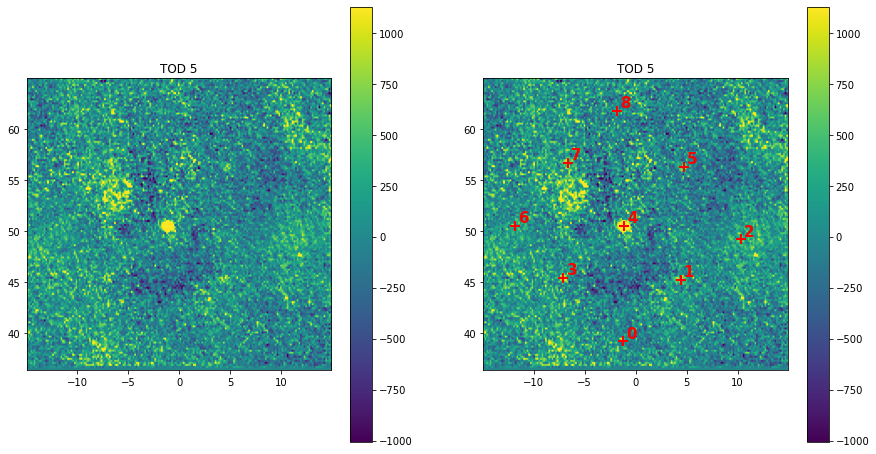

####################################################++++++++++++++++++++++
i=0
####################################################++++++++++++++++++++++


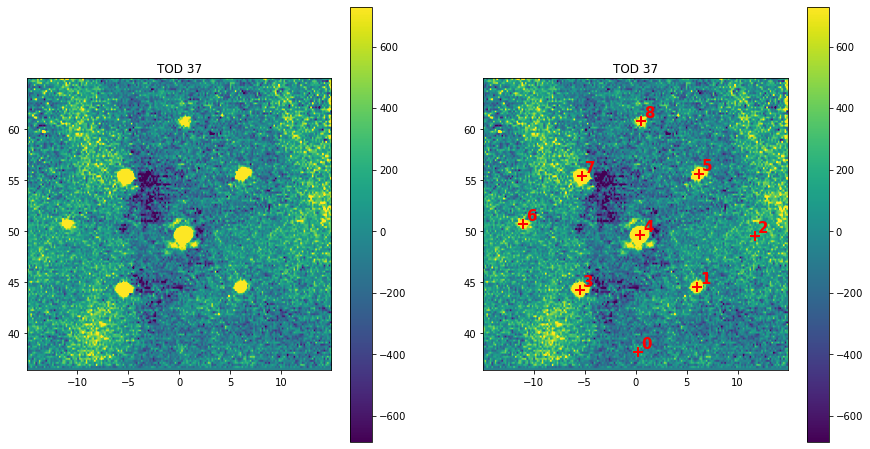

####################################################++++++++++++++++++++++
i=1
####################################################++++++++++++++++++++++


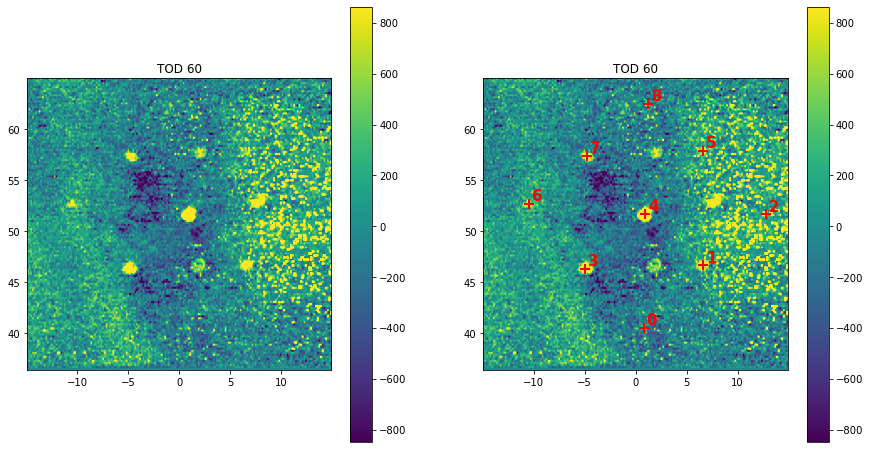

####################################################++++++++++++++++++++++
i=2
####################################################++++++++++++++++++++++


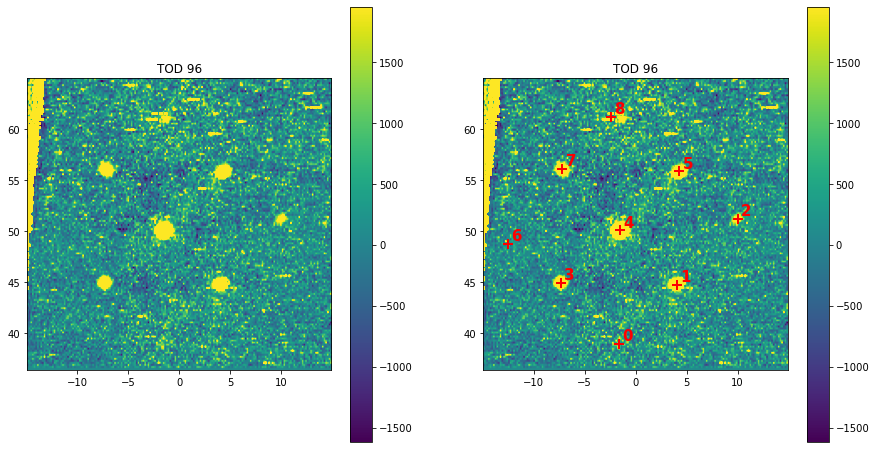

####################################################++++++++++++++++++++++
i=3
####################################################++++++++++++++++++++++


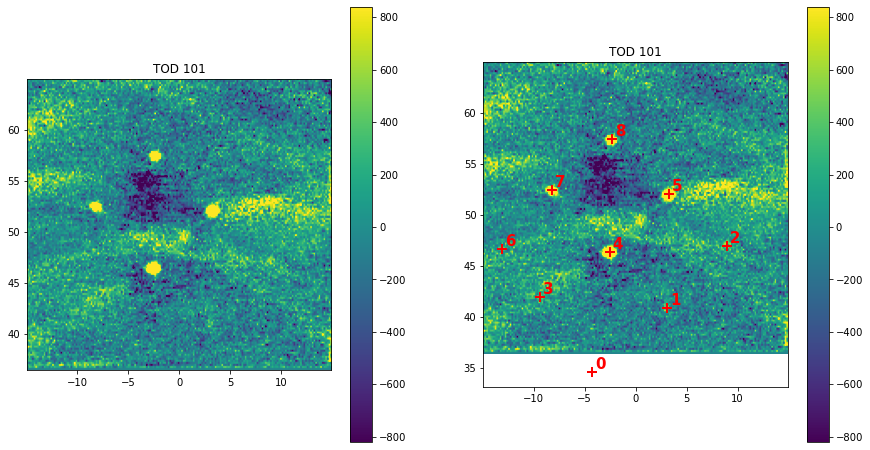

####################################################++++++++++++++++++++++
i=4
####################################################++++++++++++++++++++++


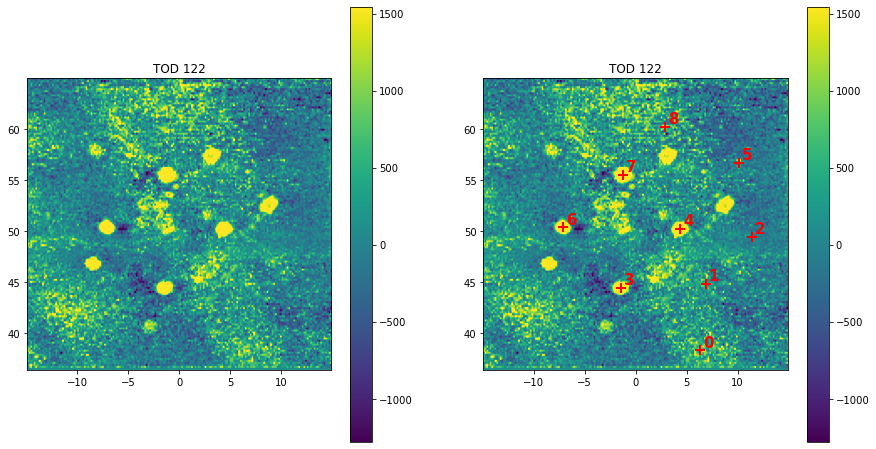

####################################################++++++++++++++++++++++
i=5
####################################################++++++++++++++++++++++


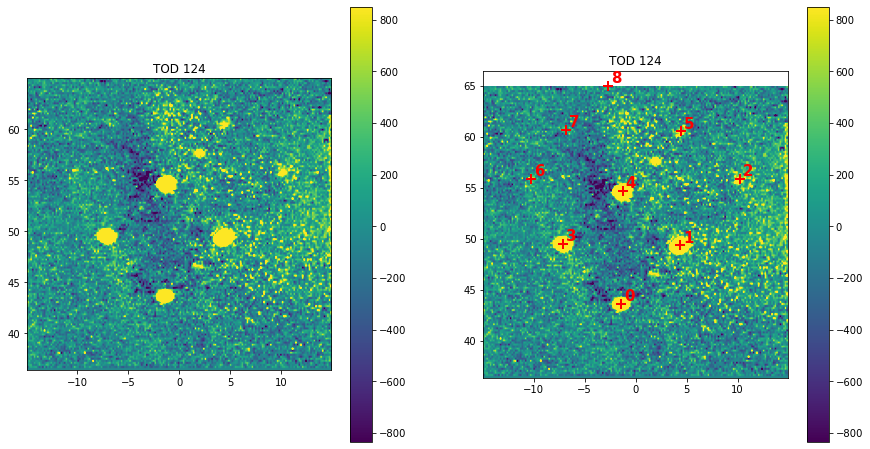

####################################################++++++++++++++++++++++
i=6
####################################################++++++++++++++++++++++


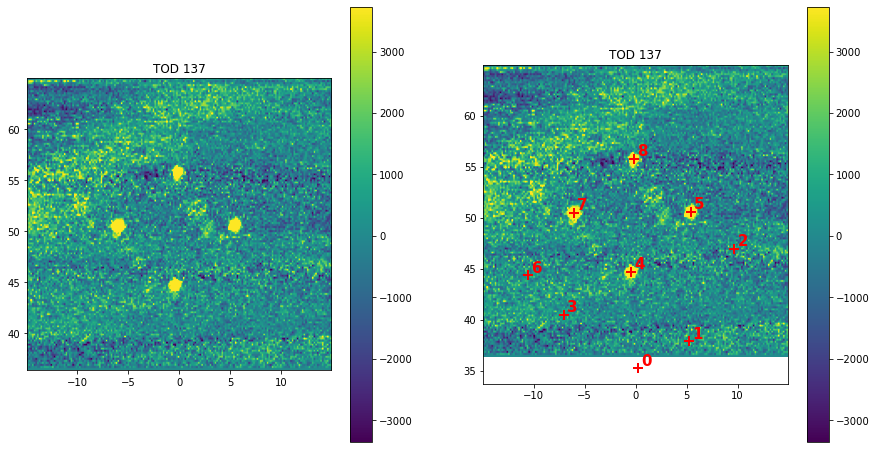

####################################################++++++++++++++++++++++
i=7
####################################################++++++++++++++++++++++


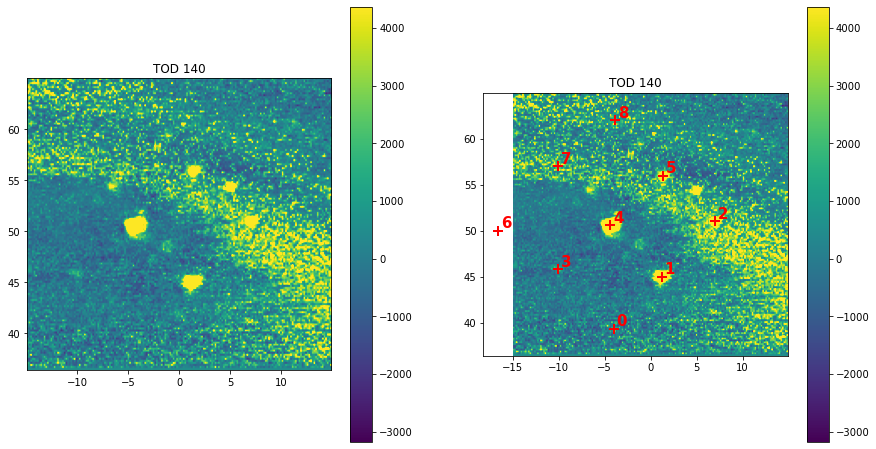

####################################################++++++++++++++++++++++
i=8
####################################################++++++++++++++++++++++


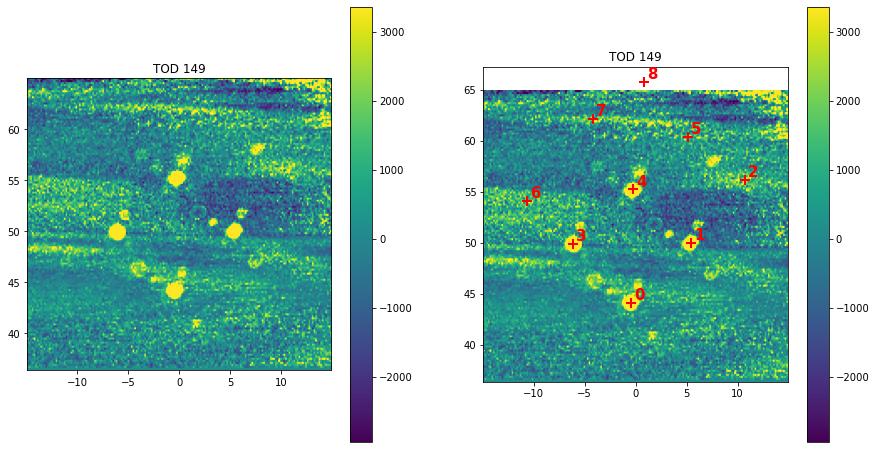

####################################################++++++++++++++++++++++
i=9
####################################################++++++++++++++++++++++


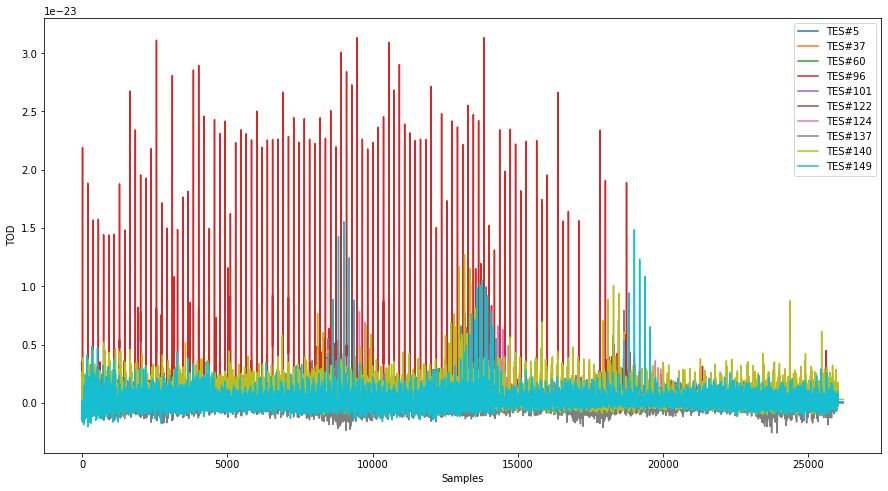

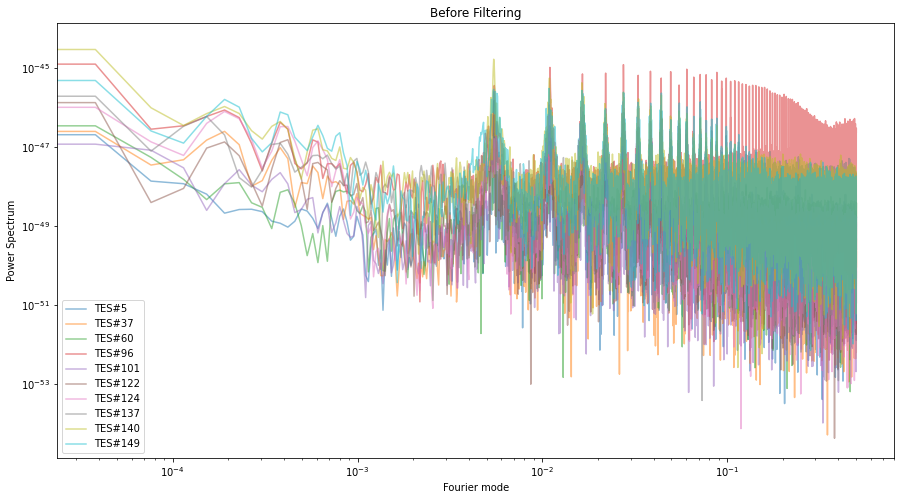

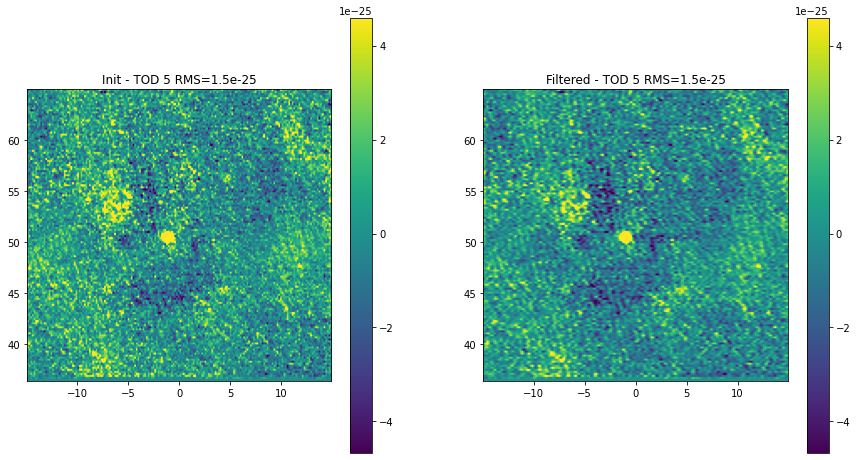

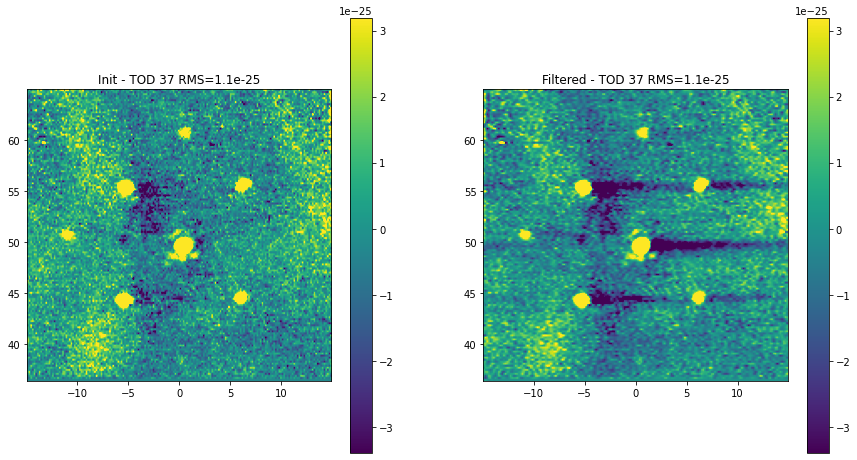

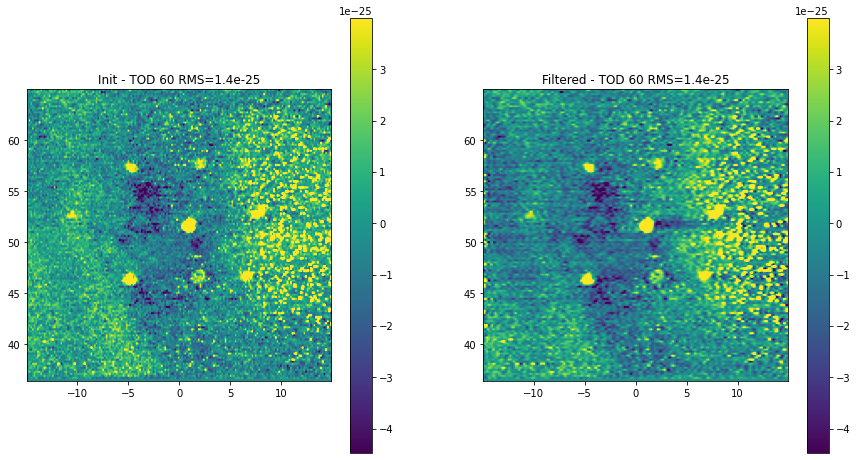

...

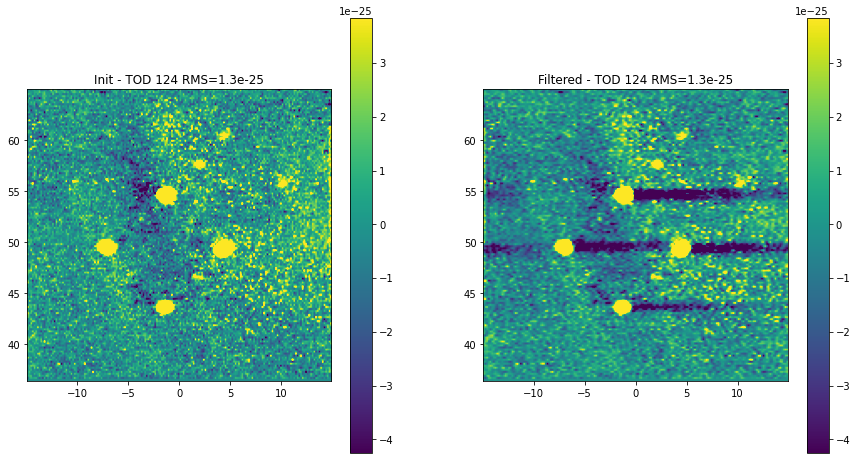

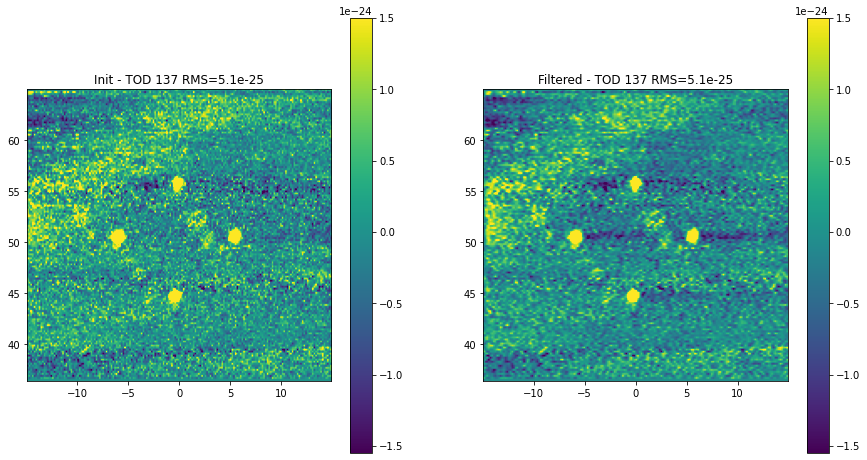

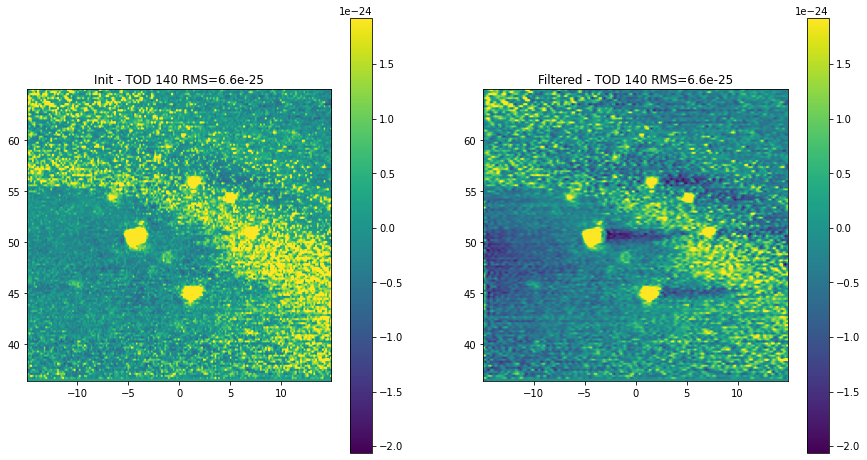

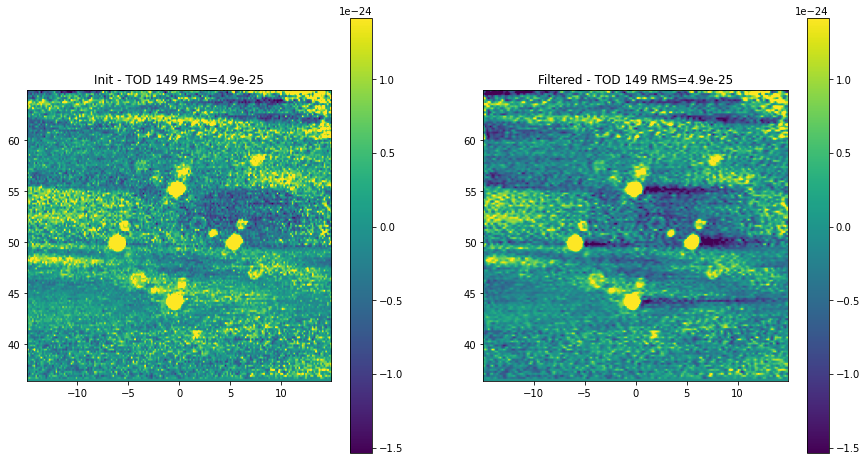

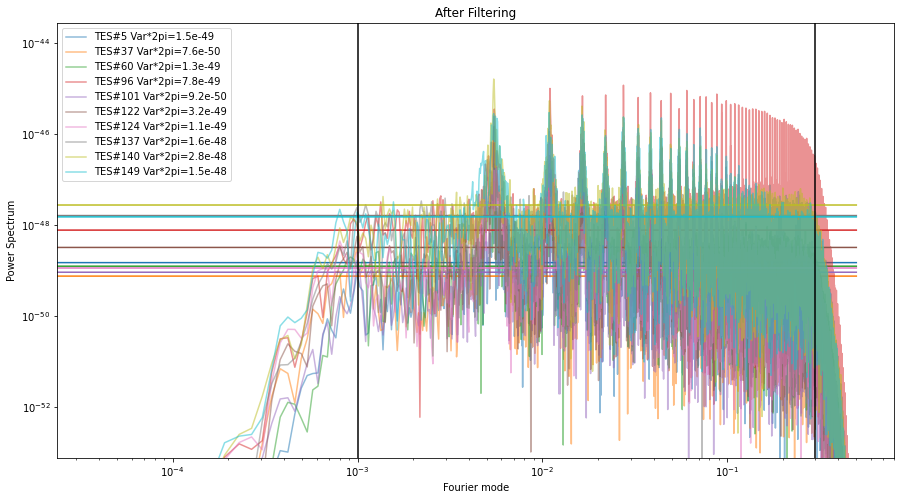

%%%%%%%%%%%%%%%%%%%%%%
you are here
len(arec) = 15
In SpectroImLib:reconstruct_maps: arec.forced_sigma0 = [1.54414010e-25 1.09756510e-25 1.41098517e-25 3.51742530e-25
 1.21116991e-25 2.26814057e-25 1.34796302e-25 5.08316965e-25
 6.63976022e-25 4.91750913e-25]
In SpectroImLib:reconstruct_maps: arec.forced_sigma1 = [1.54414010e-25 1.09756510e-25 1.41098517e-25 3.51742530e-25
 1.21116991e-25 2.26814057e-25 1.34796302e-25 5.08316965e-25
 6.63976022e-25 4.91750913e-25]
In SpectroImLib:reconstruct_maps: arec.forced_sigma2 = [1.54414010e-25 1.09756510e-25 1.41098517e-25 3.51742530e-25
 1.21116991e-25 2.26814057e-25 1.34796302e-25 5.08316965e-25
 6.63976022e-25 4.91750913e-25]
In SpectroImLib:reconstruct_maps: arec.forced_sigma3 = [1.54414010e-25 1.09756510e-25 1.41098517e-25 3.51742530e-25
 1.21116991e-25 2.26814057e-25 1.34796302e-25 5.08316965e-25
 6.63976022e-25 4.91750913e-25]
In SpectroImLib:reconstruct_maps: arec.forced_sigma4 = [1.54414010e-25 1.09756510e-25 1.41098517e-25 3.51742530e-

/Users/mwright/.local/lib/python3.9/site-packages/qubic/jchinstrument.py:1025: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  theta = theta[index]
/Users/mwright/.local/lib/python3.9/site-packages/qubic/jchinstrument.py:1026: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  phi = phi[index]
/Users/mwright/.local/lib/python3.9/site-packages/qubic/jchinstrument.py:1027: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an 

Info apcmcqubic.in2p3.fr: Allocating (262080,16) elements = 31.9921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,16) elements = 31.9921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,16) elements = 31.9921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,16) elements = 31.9921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,16) elements = 31.9921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,17) elements = 33.99169921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,17) elements = 33.99169921875 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,18) elements = 35.9912109375 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,18) elements = 35.9912109375 MiB in FSRMatrix.__init__.
Info apcmcqubic.in2p3.fr: Allocating (262080,18) elements = 35.9912109375 MiB in FSRMatrix.__init__.
Inf

/Users/mwright/.local/lib/python3.9/site-packages/pyoperators-0.13.dev1-py3.9-macosx-10.9-x86_64.egg/pyoperators/nonlinear.py:322: RuntimeWarning: invalid value encountered in reciprocal
  np.reciprocal(input, output)


This is the new preconditionner
   1: 0.6585262751872901
   2: 0.44005117586362097
   3: 0.3387340186829572
   4: 0.3090927761338982
   5: 0.2936769868151623
   6: 0.2855890444737919
   7: 0.2707706040354826
   8: 0.2267558672068488
   9: 0.21791341030437267
  10: 0.2098382374055479
  11: 0.19082273451810472
  12: 0.17094510727636392
  13: 0.1644512483672207
  14: 0.15422139324408177
  15: 0.15938507940162452
  16: 0.15045592203676844
  17: 0.14059240184886837
  18: 0.13141973599157852
  19: 0.1329410192560014
  20: 0.1253220424230347
  21: 0.12083591554744555
  22: 0.10936165293588151
  23: 0.10994285789922058
  24: 0.10471636349134976
  25: 0.09899927549601763
  26: 0.09546164369391281
  27: 0.09453433841653523
  28: 0.09184390909382945
  29: 0.0911495603317409
  30: 0.08843217335581201
  31: 0.08783251042534113
  32: 0.08382473040693711
  33: 0.08132374514964504
  34: 0.0809509534125183
  35: 0.07709845968507584
  36: 0.07532533777022352
  37: 0.07380377529922007
  38: 0.07261094147

 311: 0.014556645230787027
 312: 0.016444150515085323
 313: 0.014993943369486826
 314: 0.013854242567242466
 315: 0.013808064393524565
 316: 0.01414861263118983
 317: 0.013922407650066132
 318: 0.016539167298395302
 319: 0.017568258356245675
 320: 0.014107779218214265
 321: 0.014186252112549376
 322: 0.014144698532262925
 323: 0.013435699505269235
 324: 0.01323025298181892
 325: 0.015146624949972508
 326: 0.015263979251687706
 327: 0.013298174127273632
 328: 0.012789570277322403
 329: 0.012716592326489081
 330: 0.013188337701902697
 331: 0.013418094005076715
 332: 0.013220261804470638
 333: 0.01448224812698506
 334: 0.014651076206393106
 335: 0.012883295404974432
 336: 0.012533728330083956
 337: 0.012906143148721941
 338: 0.014319165635316666
 339: 0.014357665313677685
 340: 0.013449091048677397
 341: 0.013192148274697798
 342: 0.01281866213022347
 343: 0.01226864624875783
 344: 0.01244377989459172
 345: 0.013952514738883075
 346: 0.014337317439297554
 347: 0.012788129694011273
 348: 0

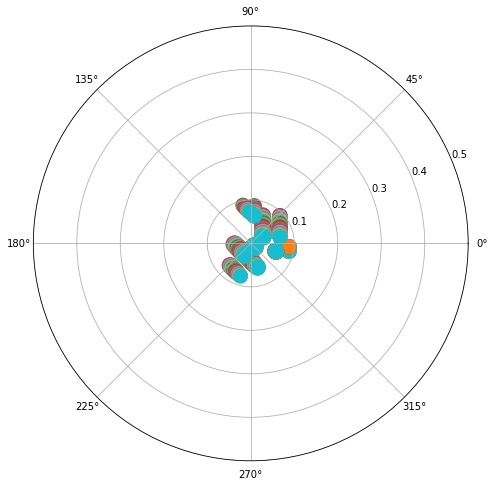

In [15]:
reso=20
center = [0,50]
nsrec = 256
nf_sub_rec = 7
all_maps_recon_th = np.zeros((nf_sub_rec, 12*nsrec**2))
all_maps_recon_custom = np.zeros((nf_sub_rec, 12*nsrec**2))
all_maps_recon_custom_new = np.zeros((nf_sub_rec, 12*nsrec**2))
d['verbose']=True
plt.clf()
all_maps_recon_custom_new, qcut, cov, nus, nus_edge = do_some_dets(detnums, d, directory, fittedpeakfile, 
                                              custom=True, nside=nsrec, refit=True, 
                                              verbose=False, doplot=True, weighted=False,
                                             azmin=azmin, azmax=azmax, remove=med, 
                                              fitted_directory=fitted_directory, nf_sub_rec=nf_sub_rec,
                                                filtering=True)
plt.show()



/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/1704740533.py:11: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


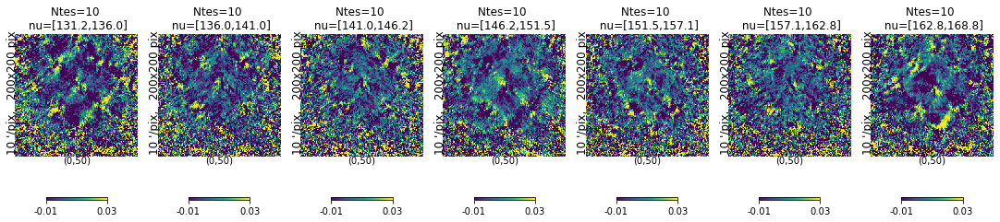

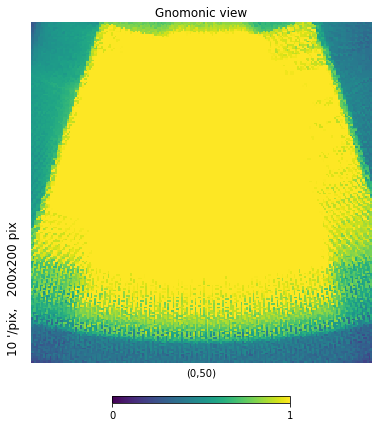

In [16]:
plt.figure()
for k in range(nf_sub_rec):
    okpix = all_maps_recon_custom_new[k,:] != 0
    mm, ss = ft.meancut(all_maps_recon_custom_new[k,okpix],3)
#     mini = mm-ss
#     maxi = mm+3*ss
    mini = -0.01
    maxi = 0.03
    hp.gnomview((all_maps_recon_custom_new[k,:]), reso=reso/2, rot=center, cmap = 'viridis', 
                title='Ntes={0:} \n nu=[{1:5.1f},{2:5.1f}]'.format(len(detnums), nus_edge[k], nus_edge[k+1]),min=mini, max=maxi, sub=(1,nf_sub_rec,k+1))
plt.tight_layout()

hp.gnomview(cov, reso=reso/2, rot=center, min=0,max=1)

/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/2586318819.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


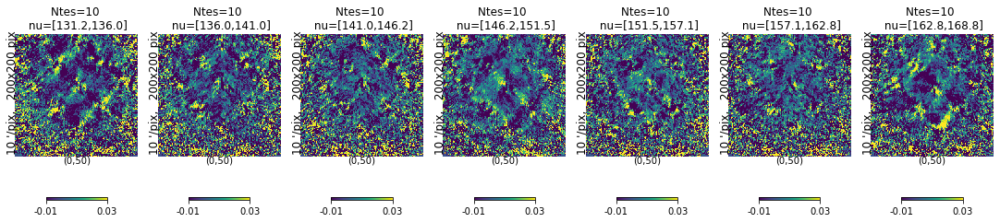

In [17]:
okpix = cov > 0.3
all_maps_recon_custom_new_cut = all_maps_recon_custom_new.copy()
all_maps_recon_custom_new_cut[:,~okpix] = 0
plt.figure()
for k in range(nf_sub_rec):
    okpix = all_maps_recon_custom_new_cut[k,:] != 0
    mm, ss = ft.meancut(all_maps_recon_custom_new_cut[k,okpix],3)
#     mini = mm-ss
#     maxi = mm+3*ss
    mini = -0.01
    maxi = 0.03
    hp.gnomview((all_maps_recon_custom_new_cut[k,:]), reso=reso/2, rot=center, cmap = 'viridis', 
                title='Ntes={0:} \n nu=[{1:5.1f},{2:5.1f}]'.format(len(detnums), nus_edge[k], nus_edge[k+1]),min=mini, max=maxi, sub=(1,nf_sub_rec,k+1))
plt.tight_layout()

In [18]:
#now save the maps
usefile=d['use_file']
if usefile == True:
    for k in range(nf_sub_rec):
        kst=str(k)
        hp.fitsfunc.write_map('PointSourcefile'+kst+'map.fits',all_maps_recon_custom_new[k,:], overwrite=True)
else:
    for k in range(nf_sub_rec):
        kst=str(k)
        hp.fitsfunc.write_map('PointSource'+kst+'map.fits',all_maps_recon_custom_new[k,:], overwrite=True)


setting the output map dtype to [dtype('float64')]
setting the output map dtype to [dtype('float64')]
setting the output map dtype to [dtype('float64')]
setting the output map dtype to [dtype('float64')]
setting the output map dtype to [dtype('float64')]
setting the output map dtype to [dtype('float64')]
setting the output map dtype to [dtype('float64')]


In [19]:
print(np.shape(all_maps_recon_custom_new))

(7, 786432)


In [20]:
#save the nus_edge
np.save('nusedge',nus_edge)

#save the coverage
np.save('coverage',cov)

/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/713167920.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


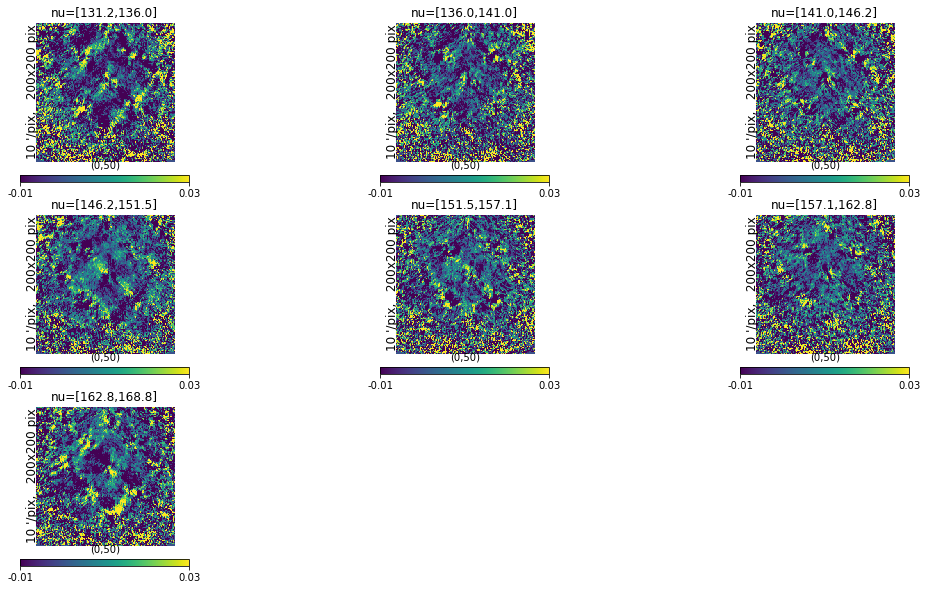

In [21]:
okpix = cov > 0.3
all_maps_recon_custom_new_cut = all_maps_recon_custom_new.copy()
all_maps_recon_custom_new_cut[:,~okpix] = 0
plt.figure()
maps = []
for k in range(nf_sub_rec):
    okpix = all_maps_recon_custom_new_cut[k,:] != 0
    mm, ss = ft.meancut(all_maps_recon_custom_new_cut[k,okpix],3)
#     mini = mm-ss
#     maxi = mm+3*ss
    mini = -0.01
    maxi = 0.03
    mymap = hp.gnomview((all_maps_recon_custom_new_cut[k,:]), reso=reso/2, rot=center, cmap = 'viridis', 
                title='nu=[{0:5.1f},{1:5.1f}]'.format(nus_edge[k], nus_edge[k+1]),min=mini, max=maxi, sub=(3,3,k+1),
               return_projected_map=True)
    maps.append(mymap)
plt.tight_layout()

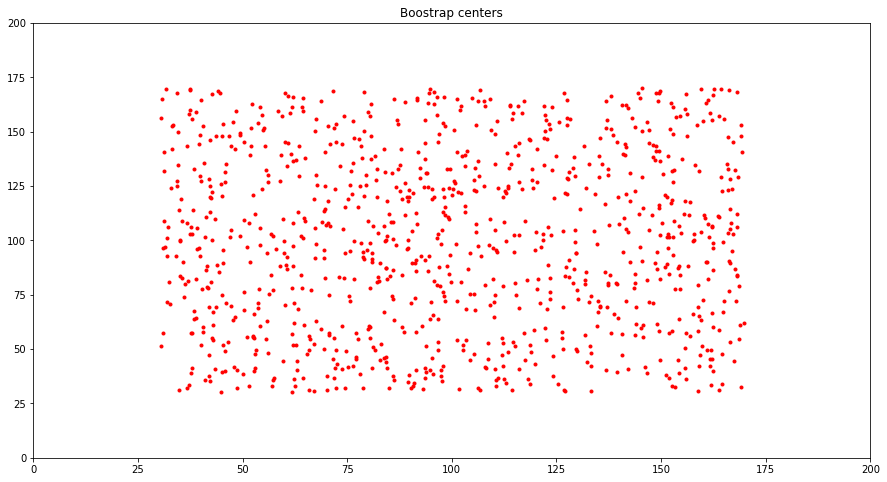

In [22]:
nu0 = 160.

sh = np.shape(maps[0])
nbmc = 1000
mycenter = np.reshape(np.array([100.,100.]), (1,2))
fracmc = 0.7
rndcenters = (np.random.rand(nbmc,2)-0.5)*(sh[0]*fracmc,sh[1]*fracmc)+mycenter
plt.plot(rndcenters[:,0], rndcenters[:,1],'r.')
plt.xlim(0,200)
plt.ylim(0,200)
plt.title('Boostrap centers')
plt.show()


/Users/mwright/opt/miniconda3/envs/Qubic/lib/python3.9/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/mwright/opt/miniconda3/envs/Qubic/lib/python3.9/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/849541750.py:29: RuntimeWarning: invalid value encountered in log10
  mag = -2.5*np.log10(flux) + magnitude_zero
/Users/mwright/opt/miniconda3/envs/Qubic/lib/python3.9/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/849541750.py:29: RuntimeWarning: invalid value encountered in lo

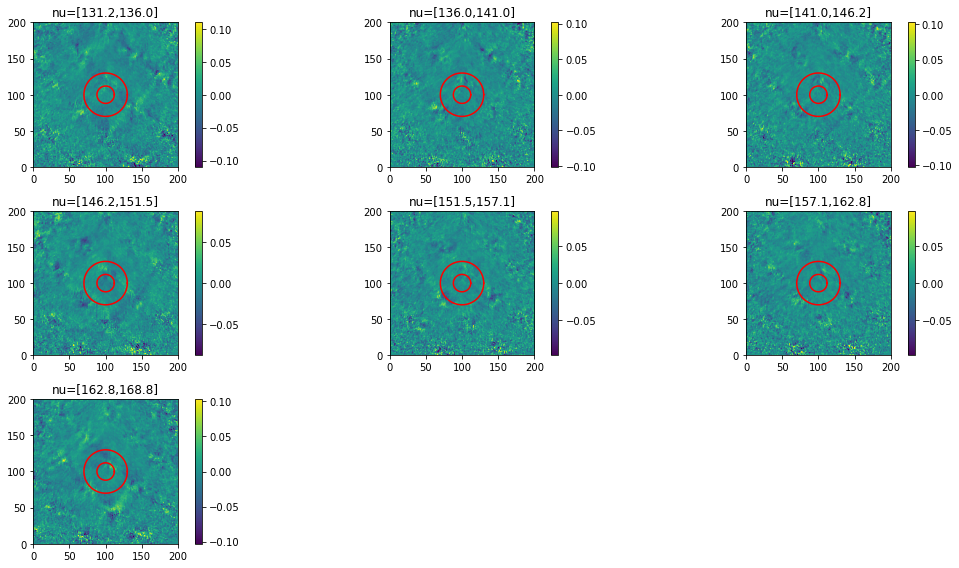

In [23]:
plt.figure()
radius = [12., 30.]
flux = np.zeros(len(maps))
mcflux = np.zeros((len(maps), nbmc))
err_flux = np.zeros(len(maps))
for i in range(len(maps)):
    plt.subplot(3,3,i+1)
    flux[i], err_flux[i], mag, err_mag = aperture_photometry(maps[i], mycenter, radius, subs=False,
                                                             plot=True, stampsize=100, magnitude_zero=0, cmap=None)
    plt.title('nu=[{0:5.1f},{1:5.1f}]'.format(nus_edge[i], nus_edge[i+1]))
    mcflux[i,:], _, mag, err_mag = aperture_photometry(maps[i], rndcenters, radius)
plt.tight_layout()

In [24]:
nus = 0.5*(nus_edge[1:]+nus_edge[:-1])
dnu = 0.5*(nus_edge[1:]-nus_edge[:-1])

covar = np.cov(mcflux)
err_flux = np.sqrt(np.diag(covar))

thsig = nu0/8/2.35
guess = np.array([0., np.max(flux), nu0, thsig ])
fitg = ft.do_minuit(nus, flux, covar, guess, functname=mygaussian, fixpars=[0,0,0,0])


Fitting with Minuit
Minos Failed !
Hesse Done
[-1.46715070e-01  1.41582211e+00  1.75926477e+02  8.35705892e-01]
[0. 0. 0. 0.]
Chi2= 7.217229595298171
ndf= 3


/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/4107223525.py:9: RuntimeWarning: `nsplit` keyword has been removed and is ignored
  fitg = ft.do_minuit(nus, flux, covar, guess, functname=mygaussian, fixpars=[0,0,0,0])
/Users/mwright/.local/lib/python3.9/site-packages/qubic/fibtools.py:268: HesseFailedWarning: HESSE Failed. Covariance and GlobalCC will not be available
  m.hesse()


In [25]:
guess = np.array([0., np.max(flux), nu0, thsig ])
fitg = ft.do_minuit(nus, flux, covar, guess, functname=mygaussian, fixpars=[0,0,1,1])

Fitting with Minuit
return Minos error Minos Done
Hesse Done
[  0.69038301  -1.64993606 160.           8.5106383 ]
[0.33419222 0.62296831 0.         0.        ]1.56979e-08  , 1.56886e-08
return Minos error 1.56984e-08  , 1.56882e-08

Chi2= 6.5157713890687265
ndf= 3


/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/2530318383.py:2: RuntimeWarning: `nsplit` keyword has been removed and is ignored
  fitg = ft.do_minuit(nus, flux, covar, guess, functname=mygaussian, fixpars=[0,0,1,1])


[  0.69038301  -1.64993606 160.           8.5106383 ]
[0.33419222 0.62296831 0.         0.        ]


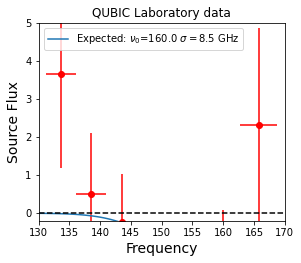

In [26]:
xxx = np.linspace(120, 180, 100)
print(fitg[1])
print(fitg[2])
plt.subplot(2,3,1)
plt.errorbar(nus,flux-fitg[1][0], yerr=err_flux, xerr=dnu, fmt='ro')
plt.plot(xxx, mygaussian(xxx, fitg[1])-fitg[1][0], label=r'Expected: $\nu_0$={0:} $\sigma=${1:3.1f} GHz'.format(nu0, thsig))
     #label=r'$\nu_0$={0:5.1f} +/- {1:5.1f}'.format(fitg[1][2], fitg[2][2])+'\n'+r'$\sigma$={0:5.1f} +/- {1:5.1f}'.format(fitg[1][3], fitg[2][3]))
plt.axhline(y=0,color='k', ls='--')
plt.title('QUBIC Laboratory data')
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Source Flux', fontsize=14)
plt.ylim(-0.2, 5)
plt.xlim(130, 170)
plt.legend(loc='upper left')

/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_53858/1156316468.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


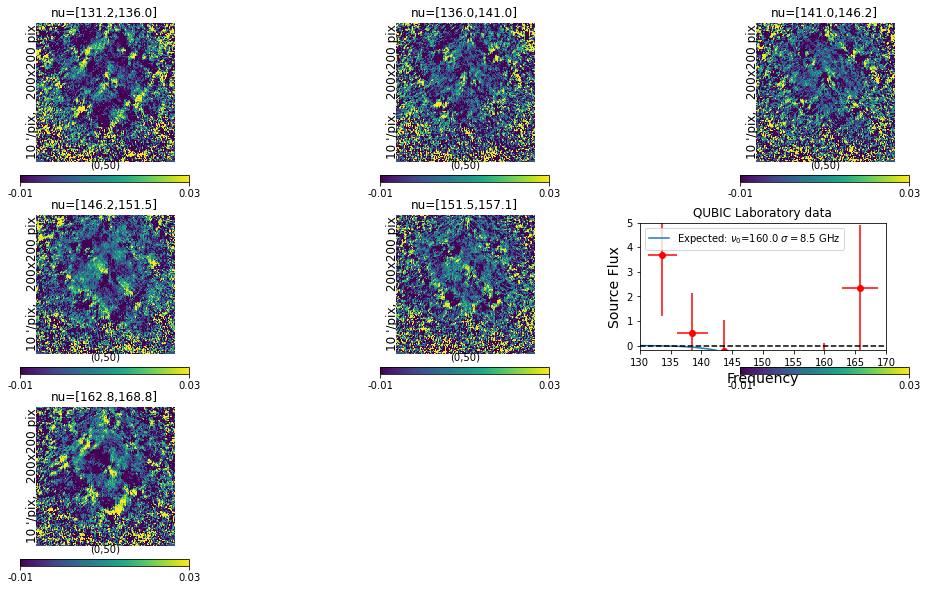

In [27]:
okpix = cov > 0.3
all_maps_recon_custom_new_cut = all_maps_recon_custom_new.copy()
all_maps_recon_custom_new_cut[:,~okpix] = 0
plt.figure()
maps = []
for k in range(nf_sub_rec):
    okpix = all_maps_recon_custom_new_cut[k,:] != 0
    mm, ss = ft.meancut(all_maps_recon_custom_new_cut[k,okpix],3)
#     mini = mm-ss
#     maxi = mm+3*ss
    mini = -0.01
    maxi = 0.03
    mymap = hp.gnomview((all_maps_recon_custom_new_cut[k,:]), reso=reso/2, rot=center, cmap = 'viridis', 
                title='nu=[{0:5.1f},{1:5.1f}]'.format(nus_edge[k], nus_edge[k+1]),min=mini, max=maxi, sub=(3,3,k+1),
               return_projected_map=True)
    maps.append(mymap)
plt.tight_layout()
plt.subplot(3,3,6)
plt.errorbar(nus,flux-fitg[1][0], yerr=err_flux, xerr=dnu, fmt='ro')
plt.plot(xxx, mygaussian(xxx, fitg[1])-fitg[1][0], label=r'Expected: $\nu_0$={0:} $\sigma=${1:3.1f} GHz'.format(nu0, thsig))
     #label=r'$\nu_0$={0:5.1f} +/- {1:5.1f}'.format(fitg[1][2], fitg[2][2])+'\n'+r'$\sigma$={0:5.1f} +/- {1:5.1f}'.format(fitg[1][3], fitg[2][3]))
plt.axhline(y=0,color='k', ls='--')
plt.title('QUBIC Laboratory data')
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Source Flux', fontsize=14)
plt.ylim(-0.2, 5)
plt.xlim(130, 170)
plt.legend(loc='upper left')


Text(0.5, 1.0, 'Correlation Matrix')

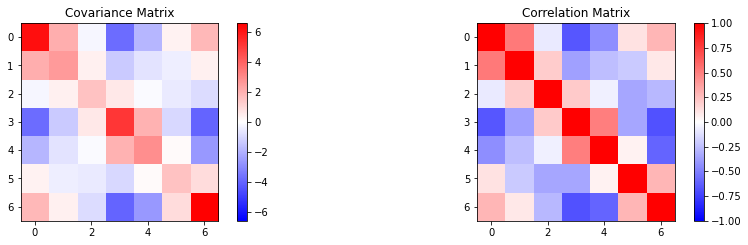

In [28]:
from qubic import QubicSkySim as qss
plt.subplot(2,2,1)
plt.imshow(covar, cmap='bwr', vmin=-np.max([np.min(covar), np.max(covar)]), vmax=np.max([np.min(covar), np.max(covar)]))
plt.colorbar()
plt.title('Covariance Matrix')

plt.subplot(2,2,2)
plt.imshow(qss.cov2corr(covar), cmap='bwr', vmin=-1, vmax=1)
plt.colorbar()
plt.title('Correlation Matrix')